#PUI2015 FINAL EXAM

#Goal: evaluate the relevance of different factors in causing asthma in NYC. 


##Motivation: 
Several environmental variables affect respiratory health. The health department finds correlation between asthma cases and a number of geographical factors, including:
proximity to highways, proximity to green spaces, criminality rate (murder rate specifically). Additionally environmental factors such as construction releasing air pollutants, unsanitary conditions, etc., may trigger respiratory problems.
In this work you will attempt to valuate the importance of these factors.


##Method: 

work on the ZIP code level.

1) __Identify the 5 facilities__ that reported the highest incidence of asthma cases and find which ZIP code they fall in.

2) __Develop a Metric__ for each of the fllowing: access to green space, murder rate, environmental health, and proximity to highways for each ZIP code (no panic, suggestions on how to proceed are in the hints file). You must choose AT LEAST 2 variables among these 4. We encourage you to work with three. Choosing 4 or more, and coming up with additional ones, is considered extra credit.

3) __Show a table__ containing the value of each variable of interest for the 5 ZIP codes corresponding to the highest cases of Asthma.

4) __Display__ each of your metrics as a choropleth (a heatmap version of a geographical map where each zip code is a different color based on the value of the metric you are mapping).

5) __Fit__ a model  (try a multivariate linear model for example or any other model which you think may be reasonable, keeping in mind you will need to use the model in the last task) to the incidence of asthma cases per NYC ZIP code (this is your dependent variable) as a function of variables mentioned above, based on the ZIP codes of the top 5 facilities reporing asthma. 

6) __Cluster__ the ZIP codes using the model you generated in step 4 as a distance metric (suggestions if needed are in the hints file).

7) __Discuss__. What did you find? What is the spatial coherence of the different factors considered, which variables seem to be more important in triggering asthma cases, what are the weaknesses of the model, how does the clustering look. 





<h1> Task 1: Querying Asthma Discharges </h1>

In this first task, you are to asked to retrieve the top 5 facility IDs that had the highest count of asthma treatments in 2013. We can assume that any case that is diagnosed as an Asthma treatment should have the word "*asthma*" (case-insensitive) in the **ccs_diagnosis_description** of the **nyc_discharge_2013**. This must be done through a SQL command.
In the data section we define a helper function <b>queryCartoDB</b> to wrap around the SQL API of CartoDB. We can simply pass in a public data source (in the form of 'https://{ACCOUNT}.cartodb.com/api/v2/sql', where ACCOUNT is the owner of the data) and a SQL statement for us to query the data in various formats including CSV, JSON, and GeoJSON. There will be three data sources (with table name in parentheses) to be queried from the CartoDB databases: so that you canget data for the New York City Hospital Inpatient 2013 Discharge, Health Facility Information, Highway streets per zip code.

Examples and bits of code you can use are provided in the PUI2015_DATA.ipynb (you can copy an paste code from there into this notebook)

After retrieveing those 5 IDs, please cross-reference them with the IDs listed in the **nyc_facility** table (this could be done with SQL or offline with GeoPandas using the **facilities** variable above). Then provide us with the following:

<ol>
<li>The list the top 5 facilities by their facility names (aka. the **facility_name** column)</li>
<li>A map of those 5 facilities in the NAD 83 / New York Long Island (EPSG:2263) coordiantes.</li>

In [1]:
#import packages
%matplotlib inline
import ast
import json
import urllib
import urllib2
from cStringIO import StringIO
import pandas as pd
import geopandas as gpd
import numpy as np
from numpy import *
import pylab as pl
import mplleaflet
from shapely.geometry import *
import matplotlib.pyplot as plt
import urllib2
from statsmodels.formula.api import ols
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster as scp
from geopandas.geoseries import *
from scipy.cluster.vq import whiten
import urllib2

#define query function for retrieving data later
SQL_SOURCE = 'https://htv210.cartodb.com/api/v2/sql'
def queryCartoDB(query, format='CSV', source=SQL_SOURCE):
    data = urllib.urlencode({'format': format, 'q': query})
    try:
        response = urllib2.urlopen(source, data)
    except urllib2.HTTPError, e:
        raise ValueError('\n'.join(ast.literal_eval(e.readline())['error']))
    except Exception:
        raise
    return StringIO(response.read())

In [2]:
#retrieve the top 5 facility IDs that had the highest count of asthma treatments in 2013 
#from New York City Hospital Inpatient 2013 Discharge data
dischargeQuery = '''
SELECT facility_id, count(facility_id) as asthma_count
FROM nyc_discharge_2013
WHERE ccs_diagnosis_description='ASTHMA'
GROUP BY facility_id
ORDER BY asthma_count DESC
LIMIT 5
'''
dischargeStream = queryCartoDB(dischargeQuery, format='CSV')
df = pd.read_csv(dischargeStream)
df.head()

,facility_id,asthma_count
0,1172,1878
1,1169,1786
2,1301,1057
3,1165,920
4,1178,890


In [3]:
#retrieve the Health Facility Information data(nyc_facilities)
facilityQuery = '''
SELECT *
FROM nyc_facilities
'''
facilityStream = queryCartoDB(facilityQuery, format='GeoJSON')
facilityData   = json.loads(facilityStream.read())
facilities     = gpd.GeoDataFrame.from_features(facilityData['features'])

#add 'geometry' column to combine lat and lon into a Point
facilities['geometry'] = gpd.GeoSeries([Point(facilities['facility_longitude'][i], facilities['facility_latitude'][i])\
                                        for i in range(len(facilities['facility_id']))])

#set initial crs and convert it into epsg 2263
facilities.crs = {'init': 'epsg:4326', 'no_defs': True}
facilities =facilities.to_crs(epsg=2263)

# print facilities.columns

In [4]:
#list the top 5 facilities by their asthma counts, facility names, Points combined from lat & lon

df['geometry']=[facilities['geometry'][facilities['facility_id']==df['facility_id'][i]].values for i in range(len(df['facility_id']))]
df['facility_name']=[facilities['facility_name'][facilities['facility_id']==df['facility_id'][i]].values for i in range(len(df['facility_id']))]

for i in range(len(df['facility_id'])):
    for a in df['geometry'][i]:
        df['geometry'][i]=a
    for a in df['facility_name'][i]:
        df['facility_name'][i]=a  
df.head()

/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,facility_id,asthma_count,geometry,facility_name
0,1172,1878,POINT (1005228.021716391 237182.1691768789),Lincoln Medical & Mental Health Center
1,1169,1786,POINT (1017278.463616514 259890.221163824),Montefiore Medical Center - Henry & Lucy Moses...
2,1301,1057,POINT (999760.5456509431 178215.3371727151),Kings County Hospital Center
3,1165,920,POINT (1026645.436320588 251684.2060465284),Jacobi Medical Center
4,1178,890,POINT (1008724.037560453 246639.2619315821),Bronx-Lebanon Hospital Center - Concourse Divi...


In [5]:
#define a function to get x,y coordinates from Point, and add x,y coord columns in df
def getXY(pt):
    return pt.x, pt.y
df['xcoord']=np.zeros(5)
df['ycoord']=np.zeros(5)
for i,geometry in enumerate (df['geometry']):
    df['xcoord'][i],df['ycoord'][i]= getXY(geometry)

#plot a map of top 5 facilities using mplleaflet in the epsg2263 coordinates
coordinates = df.as_matrix(columns=['xcoord', 'ycoord'])
pl.figure(figsize=(18, 10))
pl.scatter(coordinates[:,0], coordinates[:,1], c='r', s=40)
mplleaflet.display(epsg=2263, tiles=('https://api.mapbox.com/v4/mapbox.light/{z}/{x}/{y}.png?access_token=pk.eyJ1IjoiemhvdWpoNDIiLCJhIjoiY2VkNGU4OGE1YjEwODMxODUyMmUzNjYwZjQyOWNkODMifQ.55ZHYWs5RP3CfpIyrmOisQ',''))

/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



<h1> Task 2: Geo-referencing the facilities with the zip code highway profile</h1>

In this task, you are to asked to find out which zip code the top 5 facilities found in Task 1 belong to, and how many miles of highway streets are within its proximity. To determine which zip code a facility belongs to, you can either use SQL or GeoPandas. Your results have to be 

<ol>
<li>a list of 5 facilities (like in Task 1.1) but with two additional columns: the ZIP code and the total highway miles belonging to that zip code.</li>
<li> a map (cloropleth) of highway length for all NYC ZIP codes.
</li>

In [6]:
#retrieve Highway streets per zip code data(nyc_zipcode_highway)
zipcodeQuery = '''
SELECT *
FROM nyc_zipcode_highway
'''
zipcodeStream = queryCartoDB(zipcodeQuery, format='GeoJSON')
zipcodeData   = json.loads(zipcodeStream.read())
zipcodes      = gpd.GeoDataFrame.from_features(zipcodeData['features'])

#set initial crs and convert it into epsg 2263
zipcodes.crs = {'init': 'epsg:4326', 'no_defs': True}
zipcodes=zipcodes.to_crs(epsg=2263)

# zipcodes.head()

In [7]:
#add two additional columns to the df (top 5 facility table): 
#the ZIP code and the total highway miles belonging to that zip code
    
highways, zips = [], [] 
for i in range(5):
    for a in range(len(zipcodes['geometry'])):
        for b in range(len(zipcodes['geometry'][a])):
            if zipcodes['geometry'][a][b].contains(df['geometry'][i]):
                highways.append(zipcodes['highway_length'][a])
                zips.append(zipcodes['zipcode'][a])    
df['highway_length'] = np.array(highways)
df['zip']=np.array(zips)

df.head

<bound method DataFrame.head of    facility_id  asthma_count                                     geometry  \
0         1172          1878  POINT (1005228.021716391 237182.1691768789)   
1         1169          1786   POINT (1017278.463616514 259890.221163824)   
2         1301          1057  POINT (999760.5456509431 178215.3371727151)   
3         1165           920  POINT (1026645.436320588 251684.2060465284)   
4         1178           890  POINT (1008724.037560453 246639.2619315821)   

                                       facility_name          xcoord  \
0             Lincoln Medical & Mental Health Center  1005228.021716   
1  Montefiore Medical Center - Henry & Lucy Moses...  1017278.463617   
2                       Kings County Hospital Center   999760.545651   
3                              Jacobi Medical Center  1026645.436321   
4  Bronx-Lebanon Hospital Center - Concourse Divi...  1008724.037560   

          ycoord  highway_length    zip  
0  237182.169177        7.9141

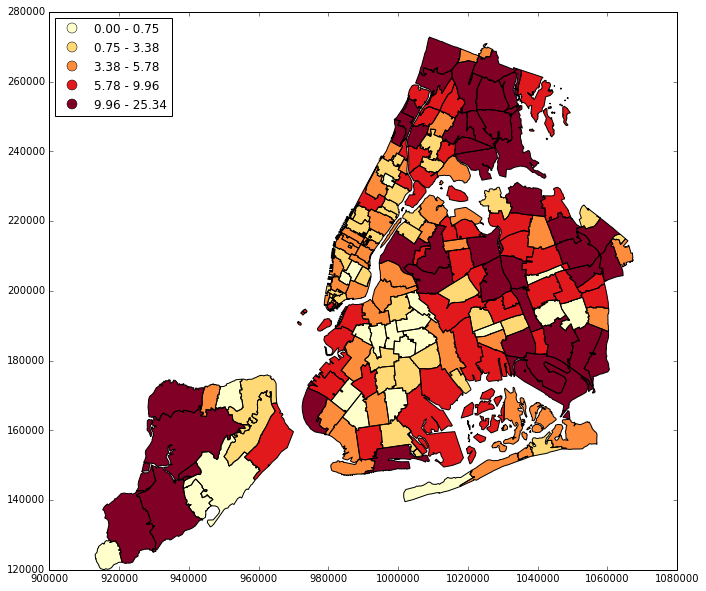

In [8]:
#plot a cloropleth map of highway length for all NYC ZIP codes
zipcodes.plot(legend=True, column='highway_length', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))

In [9]:
#plot a cloropleth map of highway length for all NYC ZIP codes using mplleaflet in the epsg2263 coordinates
zipcodes.plot(column='highway_length', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))
mplleaflet.display(epsg=2263,tiles=('https://api.mapbox.com/v4/mapbox.light/{z}/{x}/{y}.png?access_token=pk.eyJ1IjoiemhvdWpoNDIiLCJhIjoiY2VkNGU4OGE1YjEwODMxODUyMmUzNjYwZjQyOWNkODMifQ.55ZHYWs5RP3CfpIyrmOisQ',''))

<h1>TASK 3:</h1>
    
   Murder rate: find the murder rate per precinct in NYC and the precinct geographical location (see PUI2015_DATA.ipynb). Design an appropriate metric that describes the exposure to violent crimes (specifically murder) per ZIP code. This should take into account the murder rate as well as the distance to the precint where the murder occurred (suggestions on how to build the metric are in the hints file).
   Your results should be: 
    
   <ol>
    <li>a dataframe like the one derived in TASK 2 but with an additional column: the exposure to violent crimes in the ZIP code of the 5 identified facilities.</li>
    <li> choropleth of the murder rate  for all ZIP codes in NYC</li>
    
 
    

#TASK 4:
   Access to green space: find all information about size and location of NYC parks (see PUI2015_DATA.ipynb). Design an appropriate metric that describes the access to green spaces per zip code. This should take into account the size of nearby parks as well as the distance to them. Suggestions are given to you in the hints file.
   Your results should be: 
   <ol>
    <li> a dataframe like the one derived in TASK 3 but with an additional column: the access to park for the zip codes of the 5 identified facilities.</li>
    <li> choropleth of your 'access to green spaces metric' per for all ZIP codes in NYC</li>

    
 
 

In [10]:
#retrieve Parks Properties data from NYC Open Data (saved in working directory)
try:
    green = gpd.GeoDataFrame.from_file('DPR_ParksProperties_001/DPR_ParksProperties_001.shp')
except:
    try:
        green = gpd.GeoDataFrame.from_file('DPR_ParksProperties_001.shp')
    except:
        pass
# green.head()

In [11]:
# add green space metric to each zipcode by using the size of the 10 closest parks 
#divided by their distance to each zipcode
green['geometry'] = green.to_crs(zipcodes.crs).geometry    
green_metric= np.zeros(len(zipcodes['geometry']))
nearest = np.zeros((len(green['geometry']),2))
n_nearest = 10
for i,zipcode in enumerate(zipcodes['geometry']):
    for a,park in enumerate(green['geometry']):
        nearest[a][0]=zipcode.centroid.distance(park.centroid)
        nearest[a][1]=green['SHAPE_STAr'][a]/nearest[a][0]
    nearest = nearest[np.argsort(nearest[:,0])]
    green_metric[i] = np.sum(nearest[:n_nearest,1])
zipcodes['park_access'] = green_metric
zipcodes.head()

,cartodb_id,geometry,highway_length,zipcode,park_access
0,1,(POLYGON ((930304.3783042837 161178.9118938052...,23.486470,10314,12877.079129
1,2,(POLYGON ((989545.2338407208 215899.8262413288...,0.000000,10112,263.718176
2,3,(POLYGON ((981013.4939667572 197834.8189977061...,1.447405,10048,1317.255475
3,4,(POLYGON ((991780.1768988252 214661.6858826231...,0.000000,10171,277.458710
4,5,(POLYGON ((991526.8142341244 214205.8286250296...,0.000000,10172,282.148449


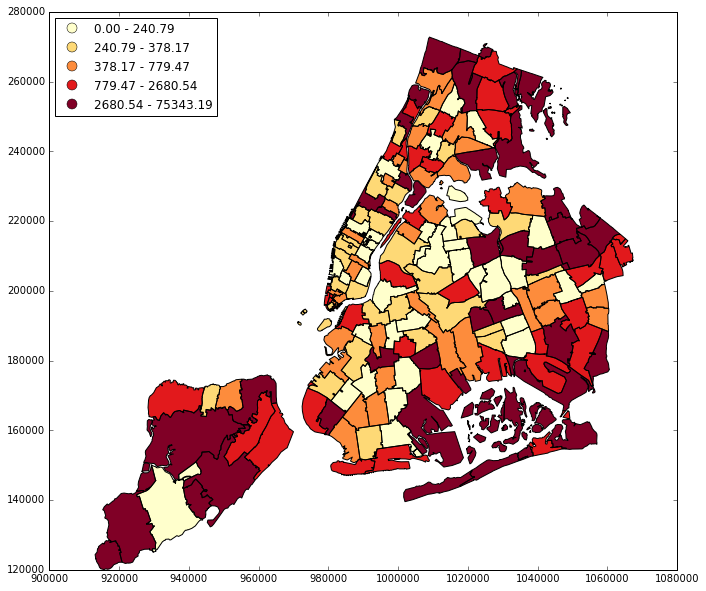

In [12]:
#plot a cloropleth map of park access for all NYC ZIP codes
zipcodes.plot(legend=True, column='park_access', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))

In [13]:
#plot a cloropleth map of park access for all NYC ZIP codes using mplleaflet in the epsg2263 coordinates
zipcodes.plot(column='park_access', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))
mplleaflet.display(epsg=2263,tiles=('https://api.mapbox.com/v4/mapbox.light/{z}/{x}/{y}.png?access_token=pk.eyJ1IjoiemhvdWpoNDIiLCJhIjoiY2VkNGU4OGE1YjEwODMxODUyMmUzNjYwZjQyOWNkODMifQ.55ZHYWs5RP3CfpIyrmOisQ',''))

In [14]:
#add an additional park_access column to the df (top 5 facility table)
park_access = []
for i in range(5):
    for a in range(len(zipcodes['geometry'])):
            for b in range(len(zipcodes['geometry'][a])):
                if zipcodes['geometry'][a][b].contains(df['geometry'][i]):
                    park_access.append(zipcodes['park_access'][a])
df['park_access'] = np.array(park_access)
df.head

<bound method DataFrame.head of    facility_id  asthma_count                                     geometry  \
0         1172          1878  POINT (1005228.021716391 237182.1691768789)   
1         1169          1786   POINT (1017278.463616514 259890.221163824)   
2         1301          1057  POINT (999760.5456509431 178215.3371727151)   
3         1165           920  POINT (1026645.436320588 251684.2060465284)   
4         1178           890  POINT (1008724.037560453 246639.2619315821)   

                                       facility_name          xcoord  \
0             Lincoln Medical & Mental Health Center  1005228.021716   
1  Montefiore Medical Center - Henry & Lucy Moses...  1017278.463617   
2                       Kings County Hospital Center   999760.545651   
3                              Jacobi Medical Center  1026645.436321   
4  Bronx-Lebanon Hospital Center - Concourse Divi...  1008724.037560   

          ycoord  highway_length    zip  park_access  
0  237182.169177 

#TASK 5:
   Environmental conditions: find the 311 data (see PUI2015_DATA.ipynb). Where and how to select it is described in the Data section and in the hints we give recommendations on how to preprocess the data. Use the 'normalized 311' data (see hints) and return: 
   <ol>
   <li> a dataframe like the one derived in TASK 4 but with an additional column containing this information</li>
   <li> make a choropleth of the normalized 311 calls relevant to environmental conditions per for all ZIP codes in NYC </li> 
    

In [15]:
#retrieve 2013 311 Calls data from NYC Open Data (I saved it on my dropbox)
url = "https://db.tt/Fw0EKbYa" 
calls = pd.read_csv(urllib2.urlopen(url))
# calls.head()

/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2871: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [16]:
#calculate normalized 311 calls by zip code using number of calls directly related to asthma cases 
#divided by total number of calls for each zip code
a=calls['Complaint Type']
envByZip = calls['Complaint Type'][(a=='Dirty Conditions')|(a=='Sewer')|(a=='UNSANITARY CONDITION')|(a=='Hazardous Material')
                               |(a=='Construction')|(a=='Indoor Air Quality')|(a=='Indoor Air Quality')|(a=='Indoor Sewage') \
                               |(a=='Air Quality')|(a=='HEATING')|(a=='Industrial Waste')|(a=='Mold')|(a=='Asbestos')\
                               |(a=='Sweeping/Missed-Inadequate')|(a=='Smoking')|(a=='Non-Residential Heat')|(a=='Lead')\
                               |(a=='Standing Water')|(a=='Water Quality')|(a=='Unsanitary Animal Facility')\
                               |(a=='PAINT - PLASTER')|(a=='GENERAL CONSTRUCTION')].groupby((calls['Incident Zip'])).count()
totalByZip = calls['Complaint Type'].groupby(calls['Incident Zip']).count()
envNormalized = envByZip/totalByZip

#replace extremely large ratio(s) that may twist the data with the mean for rest of data
for i,env in enumerate(envNormalized):
    i=str(i)
    if env>=0.8:
        env=(np.sum(envNormalized)-env)/(len(envNormalized)-1)

#add normalized 311 calls (environment) metric to each zipcode (the zipcodes dataframe)
zipcodes['Environment']=np.zeros(len(zipcodes['zipcode']))
for i,zipcode in enumerate(zipcodes['zipcode']):
    try:
        zipcodes['Environment'][i]=envNormalized[zipcode]
    except IndexError:
        zipcodes['Environment'][i]=0
zipcodes['Environment'][isnan(zipcodes['Environment'])] = 0
zipcodes.head()


/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,cartodb_id,geometry,highway_length,zipcode,park_access,Environment
0,1,(POLYGON ((930304.3783042837 161178.9118938052...,23.486470,10314,12877.079129,0.141888
1,2,(POLYGON ((989545.2338407208 215899.8262413288...,0.000000,10112,263.718176,0.000000
2,3,(POLYGON ((981013.4939667572 197834.8189977061...,1.447405,10048,1317.255475,0.000000
3,4,(POLYGON ((991780.1768988252 214661.6858826231...,0.000000,10171,277.458710,0.000000
4,5,(POLYGON ((991526.8142341244 214205.8286250296...,0.000000,10172,282.148449,0.000000


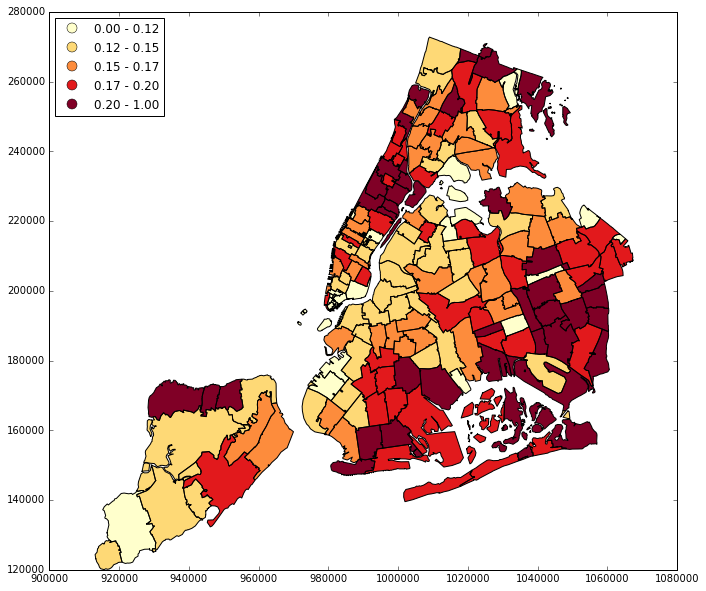

In [17]:
#plot a cloropleth map of 311-normalized calls(environment) for all NYC ZIP codes
zipcodes.plot(legend=True, column='Environment', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))

In [18]:
#plot a cloropleth map of 311-normalized calls(environment) for all NYC ZIP codes using mplleaflet in the epsg2263 coordinates
zipcodes.plot(column='Environment', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))
mplleaflet.display(epsg=2263,tiles=('https://api.mapbox.com/v4/mapbox.light/{z}/{x}/{y}.png?access_token=pk.eyJ1IjoiemhvdWpoNDIiLCJhIjoiY2VkNGU4OGE1YjEwODMxODUyMmUzNjYwZjQyOWNkODMifQ.55ZHYWs5RP3CfpIyrmOisQ',''))

In [19]:
#add an additional 311-normalized calls(environment) column to the df (top 5 facility table)
env = []
for i in range(5):
    for a in range(len(zipcodes['geometry'])):
            for b in range(len(zipcodes['geometry'][a])):
                if zipcodes['geometry'][a][b].contains(df['geometry'][i]):
                    env.append(zipcodes['Environment'][a])
df['environment'] = np.array(env)
df.head

<bound method DataFrame.head of    facility_id  asthma_count                                     geometry  \
0         1172          1878  POINT (1005228.021716391 237182.1691768789)   
1         1169          1786   POINT (1017278.463616514 259890.221163824)   
2         1301          1057  POINT (999760.5456509431 178215.3371727151)   
3         1165           920  POINT (1026645.436320588 251684.2060465284)   
4         1178           890  POINT (1008724.037560453 246639.2619315821)   

                                       facility_name          xcoord  \
0             Lincoln Medical & Mental Health Center  1005228.021716   
1  Montefiore Medical Center - Henry & Lucy Moses...  1017278.463617   
2                       Kings County Hospital Center   999760.545651   
3                              Jacobi Medical Center  1026645.436321   
4  Bronx-Lebanon Hospital Center - Concourse Divi...  1008724.037560   

          ycoord  highway_length    zip  park_access  environment  
0  2

#TASK 6:
  create a regression model for the 5 zip codes that includes at least 2 of the variables (fewer than 2 will not allow a passing grade): 
  highway length in the zip code, exposure to violent crimes in that zip code, 
  access to green spaces in that zip code, 311-normalized calls in that zip code. 
        
  Report the statistics for your model and assess how well it describes the dependent variable.
    

In [20]:
#whiten the data
df['highway_length']=whiten(df['highway_length'])
df['park_access']=whiten(df['park_access'])
df['environment']=whiten(df['environment'])

# create a regression model for the 5 zip codes using highway length, access to green spaces, 311-normalized calls
# in the zip code to estimate asthma_count
model = ols("asthma_count ~ highway_length + park_access + environment", data=df).fit()
intercept,coef_highway,coef_park,coef_env = model.params
print intercept,coef_highway,coef_park,coef_env
print model.summary()

4964.80725948 -939.733712871 1020.50361515 -239.957111977
                            OLS Regression Results                            
Dep. Variable:           asthma_count   R-squared:                       0.598
Model:                            OLS   Adj. R-squared:                 -0.607
Method:                 Least Squares   F-statistic:                    0.4966
Date:                Tue, 22 Dec 2015   Prob (F-statistic):              0.749
Time:                        22:29:36   Log-Likelihood:                -35.179
No. Observations:                   5   AIC:                             78.36
Df Residuals:                       1   BIC:                             76.80
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [95.0% Conf. Int.]
---------------------------------------------------------------------

/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/statsmodels/stats/stattools.py:72: UserWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  "samples were given." % int(n))


###I chose to whiten the data before doing the regression because otherwise the coefficient would be extremely different in scale. However, the regression does not appear to be a good model since the the adj. R-squared is negative (which can be considered 0) and the p value for both three variables are not significant.
###A typical zip code area with higher asthma rate tends to have shorter highway length, better park access, and less environmental complaints. This result is contradictory to our common sense, which may possibly caused by limited values considered in the calculation. On the other hand, the result can be explained in opposite way. Shorter highway length indicates limited transportation access, and concequent lower property price and poorer neighborhood, thus more vulnerability to the asthma.

#TASK 7:
   Use the elements of this model to cluster NYC zip codes by asthma risk. Your distance metric cna be bilt on the result of the regression. See Hints file if you need help on this task
   
   The result will be a map of the clusters.

In [21]:
#whiten the data
zipcodes['highway_length']=whiten(zipcodes['highway_length'])
zipcodes['park_access']=whiten(zipcodes['park_access'])
zipcodes['environment']=whiten(zipcodes['Environment'])

# Calculate using this equation: Asthma_Rate=park_access_coef∗(park_access)+highway_len_coef∗(highway_length)+env_coef∗(environment)
zipcodes['Asthma_Rate']=np.zeros(len(zipcodes['zipcode']))
for i in range(len(zipcodes['zipcode'])):
    zipcodes['Asthma_Rate'][i]=coef_highway*zipcodes['highway_length'][i]+ coef_park*zipcodes['park_access'][i]\
    +coef_env*zipcodes['Environment'][i]
zipcodes.head()

/Users/JianhaoZhou/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,cartodb_id,geometry,highway_length,zipcode,park_access,Environment,environment,Asthma_Rate
0,1,(POLYGON ((930304.3783042837 161178.9118938052...,4.208367,10314,2.160449,0.141888,1.552429,-1784.045258
1,2,(POLYGON ((989545.2338407208 215899.8262413288...,0.000000,10112,0.044245,0.000000,0.000000,45.152448
2,3,(POLYGON ((981013.4939667572 197834.8189977061...,0.259350,10048,0.221002,0.000000,0.000000,-18.186239
3,4,(POLYGON ((991780.1768988252 214661.6858826231...,0.000000,10171,0.046551,0.000000,0.000000,47.505031
4,5,(POLYGON ((991526.8142341244 214205.8286250296...,0.000000,10172,0.047337,0.000000,0.000000,48.307983


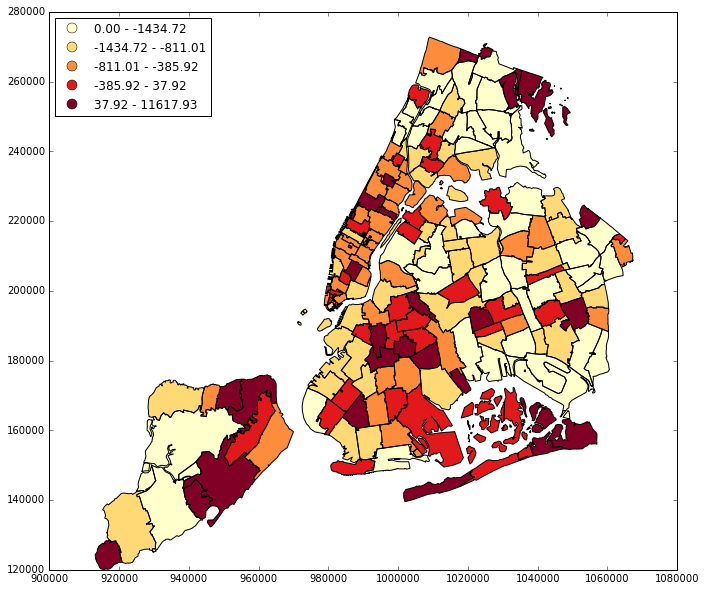

In [22]:
#plot a cloropleth map of calculated Asthma_Rate for all NYC ZIP codes
zipcodes.plot(legend=True, column='Asthma_Rate', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))

In [23]:
#plot a cloropleth map of calculated Asthma_Rate for all NYC ZIP codes and top five facilities 
#using mplleaflet in the epsg2263 coordinates
zipcodes.plot(column='Asthma_Rate', scheme='QUANTILES', k=5, alpha=1.0, colormap='YlOrRd', figsize=(18,10))
pl.scatter(coordinates[:,0], coordinates[:,1], c='r', s=40)
mplleaflet.display(epsg=2263,tiles=('https://api.mapbox.com/v4/mapbox.light/{z}/{x}/{y}.png?access_token=pk.eyJ1IjoiemhvdWpoNDIiLCJhIjoiY2VkNGU4OGE1YjEwODMxODUyMmUzNjYwZjQyOWNkODMifQ.55ZHYWs5RP3CfpIyrmOisQ',''))

In [24]:
#define an NxN matrix dist that contains the combined effect of the origin and destination zips 
#for their geometry centroid i and a
dist = np.zeros( (len(zipcodes['zipcode']),len(zipcodes['zipcode'])) )
for i in range(len(zipcodes['zipcode'])):
    for a in range(len(zipcodes['zipcode'])):
        dist[i][a]=np.sqrt(np.square(coef_env*(zipcodes['Environment'][i]-zipcodes['Environment'][a]))+\
                          np.square(coef_park*(zipcodes['park_access'][i]-zipcodes['park_access'][a]))+\
                          np.square(coef_highway*(zipcodes['highway_length'][i]-zipcodes['highway_length'][a])))

# define weighted_affinity function for later callable clustering parameter 
def weighted_affinity(data):
    return whiten(dist)

In [25]:
#get the centroid of all zipcodes
allcoordinates = np.zeros((len(zipcodes['geometry']),2))
for i,geometry in enumerate (zipcodes['geometry']):
    allcoordinates[i][0],allcoordinates[i][1]=getXY(geometry.centroid)

# whiten the coordinates
w = whiten(allcoordinates)

#Conduct Agglomerative Clustering on zip code centroids using weighted_affinity defined above
agc = AgglomerativeClustering(n_clusters=5,linkage='average',affinity=weighted_affinity).fit(w)

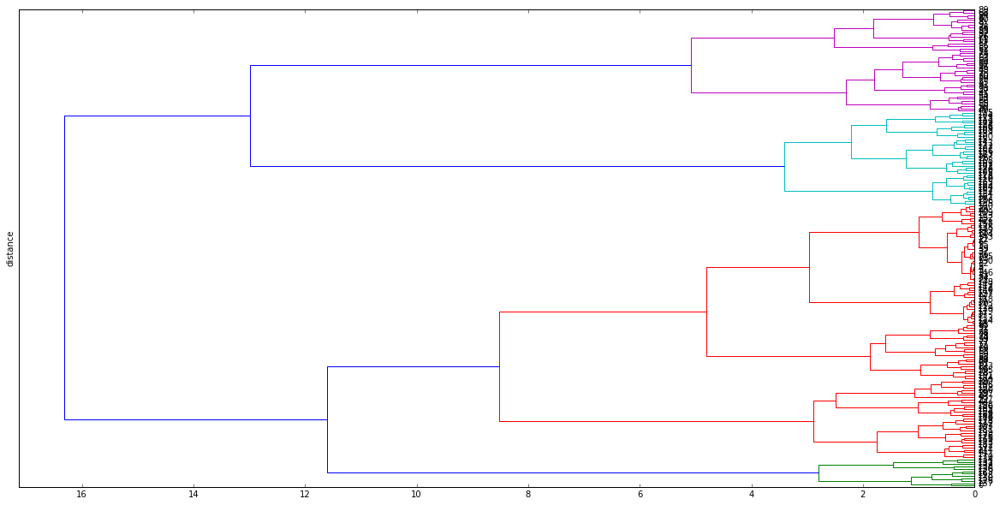

In [26]:
#plot Agglomerative Clustering dendrogram
fig = pl.figure(figsize=(20,10))
pl.ylabel("distance")
ddg = scp.hierarchy.dendrogram(scp.hierarchy.linkage(w, method='ward'),
                               leaf_rotation=90,  # rotates the x axis labels
                               leaf_font_size=8,orientation='right')  # font size for the x axis labels)
pl.grid('off')

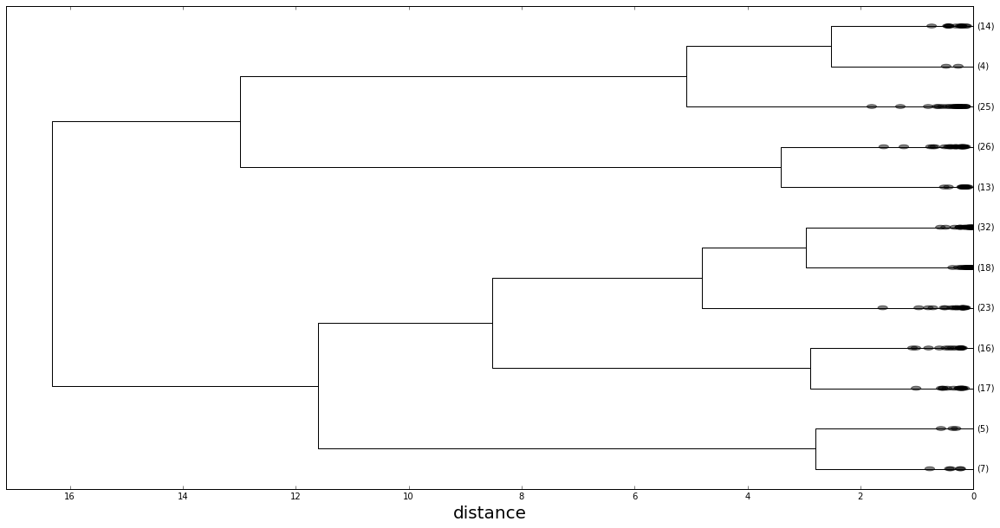

In [27]:
#plot Agglomerative Clustering dendrogram
fig = pl.figure(figsize=(20,10))
ddg = scp.hierarchy.dendrogram(scp.hierarchy.linkage(w, method='ward'),
                               leaf_rotation=90.,  # rotates the x axis labels
                               leaf_font_size=20, truncate_mode='lastp', p=12, 
                               show_contracted=True, color_threshold = 2, 
                               orientation='right', above_threshold_color='k'
                              )  # font size for the x axis labels)
#pl.xticks(rotation=90)
pl.xlabel("distance", fontsize=20)
pl.grid('off')

In [29]:
#plot a cloropleth map of five clusters for all NYC ZIP codes and top five facilities using mplleaflet 
zipcodes['cluster'] = agc.labels_
zipcodes.plot(colormap='Set3', column='cluster', k=5, alpha=1.0, figsize=(18,10))
pl.scatter(coordinates[:,0], coordinates[:,1], c='r', s=40)
mplleaflet.display(epsg=2263,tiles=('https://api.mapbox.com/v4/mapbox.light/{z}/{x}/{y}.png?access_token=pk.eyJ1IjoiemhvdWpoNDIiLCJhIjoiY2VkNGU4OGE1YjEwODMxODUyMmUzNjYwZjQyOWNkODMifQ.55ZHYWs5RP3CfpIyrmOisQ',''))

##DISCUSSION

###As mentioned in Task 6, the regression model is far from perfect (negative R-squared and high p value for each variable), the later calculatation of clustering with weighted distance is thus influenced by this inaccuracy. In the map of calculated Asthma_Rate for all NYC zip codes, zip code areas with high asthma rate are concentrate in eastern Staten Island, central Brooklyn, Far Rockaway, Manhanttan at large, disparse areas in Brooklyn and Queens. Three of the five top facilities are located in the zipcodes with high calculated asthma rate. In the map of five clusters for all NYC zip codes, top five facilities are located in the same cluster that includes most of the zip codes in NYC. The rest of clusters consist of zip codes that are very far from each other.

###There are a plenty of limitations. First, the number of values used for the calculation of regression model is extremly limited (top five facilities). This can be improved by applying total asthma counts for every facility to calculate the regression. Second, the number of variables used to calculation is limited. There might be some important factors that we may easily ignore according to our common sense. We should include more variables in future analysis. Third, the metric developed for each variables needs further thoughts. Some ways of normalization (like 311 calls) may need further exploration.